#DD2424 Deep Learning, KTH
##Assignment 1
###```Due 05.04.2024```
###Author: ```Prashant Yadava (yadava@kth.se)```


##Goal:
In this assignment, we train and test a one layer neural network with multiple outputs to classify images from [CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar.html) dataset.

###One Layer Network
One layer neural network means that we would only be working with one set of weights and biases applied to the input data to make predictions.

###Multiple Outputs
The network will be trained to classify images into multiple categories. In the CIFAR-10 dataset, there are 10 categories, so the network needs to output probabilities for each of these categories.

###Training and Testing
The training will involve using mini-batch gradient descent applied to a cost function that computes the cross-entropy loss of the classifier applied to the labelled training data and a $L_2$ regularization term on the weight matrix.

###Mini-batch gradient descent
Instead of updating the weights and biases after each training example, we'll update them in small batches of data. This is more efficient and helps the network converge faster

###Cost Function
The cross function which is used to measure how well the network is performing would be the cross-entropy loss. It measures the difference between the predicted probabilities and the actual labels of the training data.

###$L_2$ Regularization
In addition to the cross-entropy loss, we'll also add a regularization term to the cost function. This term penalizes large weights in the network, which helps prevent overfitting.


**Task**: Train a multi-linear classifier
* Dataset: CIFAR-10
* Training Data: ``data_batch_1``
* Validation Data: ``data_batch_2``




In [10]:
import pickle
import numpy as np
import numpy.testing as npt

import matplotlib.pyplot as plt
import random

##Obtain the data

CIFAR-10: labeled subsets of 80 million tiny images datasets

The original data is available at
[CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz)

Below we download and extract the data locally to a folder.

Modules used:
1. [urlretrieve](https://docs.python.org/3.0/library/urllib.request.html) : working with network objects
2. [tarfile](https://docs.python.org/2/library/tarfile.html) : handling tar files
3. [tqdm](https://pypi.python.org/pypi/tqdm) : progress monitor

In [11]:
cifar_10_url = 'https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz'
cifar_10_file = 'cifar-10-python.tar.gz'

from urllib.request import urlretrieve
from os.path import  isfile, isdir
from tqdm import tqdm #progress bar etc
import tarfile #ability to read and write tar files


cifar10_data_folder_path = 'cifar-10-batches-py'

class DownloadProgress(tqdm):
  last_block = 0

  def hook(self, block_num=1, block_size=1, total_size=None):
    if total_size is not None:
      self.total = total_size
      self.update(block_num * block_size - self.n)

  """
  check if the file is already existing, if not, download it from the source
  """

if not isfile(cifar_10_file):
  with DownloadProgress(unit='B', unit_scale=True, miniters=1, desc='CIFAR-10 Dataset') as pbar:
    #retrieve a url into a temporary location on the disk
    urlretrieve(
        cifar_10_url,
        cifar_10_file,
        pbar.hook
    )

if not isdir(cifar10_data_folder_path):
  with tarfile.open(cifar_10_file) as tar:
    tar.extractall()
    tar.close()



Now we have the data extracted in the folder cifar-10-batches-py.

We shall use the following batches:

* Training data: ***```data_batch_1```***
* Validation data: ***```data_batch_2```***
* Test data: ***```data_batch```***


#Understanding the data

The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.

The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random order, but some training batches may contain more images from one class than another. Between them, the training batches contain exactly 5000 images from each class.

A batch here is ```10000x3072``` dimensional tensor expressed in numpy array. Here, 3072 indicates the pixel values of a ```32*32``` image having 3 channel color information ```(32*32*3 = 3072)```.

From the data CIFAR-10 website:

```
each of the batch files contains a dictionary with the following elements:
data -- a 10000x3072 numpy array of uint8s. Each row of the array stores a 32x32 colour image. The first 1024 entries contain the red channel values, the next 1024 the green, and the final 1024 the blue. The image is stored in row-major order, so that the first 32 entries of the array are the red channel values of the first row of the image.
labels -- a list of 10000 numbers in the range 0-9. The number at index i indicates the label of the ith image in the array data.```



### Have the labels ready
Have the labels listed in the correct order as per the CIFAR datasets

In [12]:
def load_label_names():
    return ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

#Read in the data
### Function to load a data batch (used only for insights)
Next we create a function which loads a batch based on a requested batch index. The function returns the features (the RGB values for each of the 32x32 pixel) for each image, as well as the image label.

In [13]:
def load_batch(cifar10_data_folder_path, batch_id):
  with open(cifar10_data_folder_path + '/data_batch_' + str(batch_id), mode='rb') as file:
    batch = pickle.load(file, encoding='latin1')

  features = batch['data'].reshape((len(batch['data']), 3, 32, 32)).transpose(0,2,3,1)
  labels = batch['labels']

  return features, labels

#Insights into data

In [14]:
def display_stats(cifar10_data_folder_path, batch_id, sample_id):
  features, labels = load_batch(cifar10_data_folder_path, batch_id)

  if not (0 <= sample_id < len(features)):
    print ('{} samples in batch {}. {} is out of range.'.format(len(features), batch_id, sample_id))
    return None

  print('\nStats of batch #{}:'.format(batch_id))
  print('# of Samples: {}\n'.format(len(features)))

  label_names = load_label_names()
  label_counts = dict(zip(*np.unique(labels, return_counts=True)))

  for key, value in label_counts.items():
    print('Label Counts of [{}]({}) : {}'.format(key, label_names[key].upper(), value))

  sample_image = features[sample_id]
  sample_label = labels[sample_id]

  print('\n Example of Image {}'.format(sample_id))
  print('Image - Min Value : {} Max Value: {}'.format(sample_image.min(), sample_image.max()))
  print('Image - Shape: {}'.format(sample_image.shape))
  print('Label - Lable Id: {} Name: {}'.format(sample_label, label_names[sample_label]))

  plt.figure(figsize=(2, 2))  # figsize=(width, height) in inches
  plt.imshow(sample_image)
  plt.show()

# Checking out some random images in the datasets


Stats of batch #2:
# of Samples: 10000

Label Counts of [0](AIRPLANE) : 984
Label Counts of [1](AUTOMOBILE) : 1007
Label Counts of [2](BIRD) : 1010
Label Counts of [3](CAT) : 995
Label Counts of [4](DEER) : 1010
Label Counts of [5](DOG) : 988
Label Counts of [6](FROG) : 1008
Label Counts of [7](HORSE) : 1026
Label Counts of [8](SHIP) : 987
Label Counts of [9](TRUCK) : 985

 Example of Image 8721
Image - Min Value : 0 Max Value: 248
Image - Shape: (32, 32, 3)
Label - Lable Id: 5 Name: dog


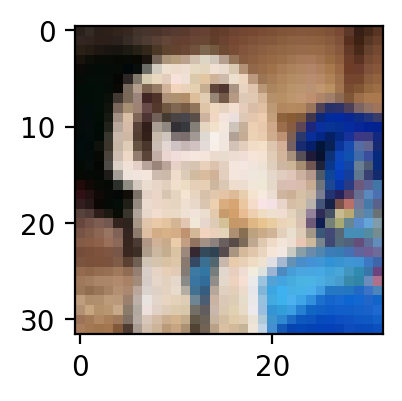


Stats of batch #2:
# of Samples: 10000

Label Counts of [0](AIRPLANE) : 984
Label Counts of [1](AUTOMOBILE) : 1007
Label Counts of [2](BIRD) : 1010
Label Counts of [3](CAT) : 995
Label Counts of [4](DEER) : 1010
Label Counts of [5](DOG) : 988
Label Counts of [6](FROG) : 1008
Label Counts of [7](HORSE) : 1026
Label Counts of [8](SHIP) : 987
Label Counts of [9](TRUCK) : 985

 Example of Image 2982
Image - Min Value : 7 Max Value: 217
Image - Shape: (32, 32, 3)
Label - Lable Id: 1 Name: automobile


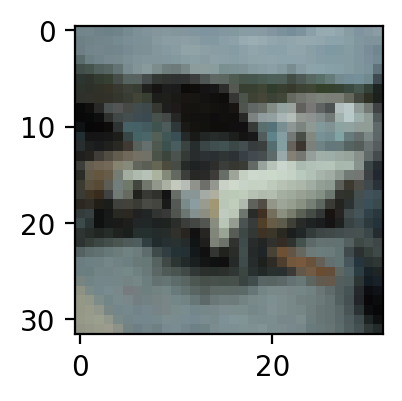


Stats of batch #2:
# of Samples: 10000

Label Counts of [0](AIRPLANE) : 984
Label Counts of [1](AUTOMOBILE) : 1007
Label Counts of [2](BIRD) : 1010
Label Counts of [3](CAT) : 995
Label Counts of [4](DEER) : 1010
Label Counts of [5](DOG) : 988
Label Counts of [6](FROG) : 1008
Label Counts of [7](HORSE) : 1026
Label Counts of [8](SHIP) : 987
Label Counts of [9](TRUCK) : 985

 Example of Image 8149
Image - Min Value : 12 Max Value: 240
Image - Shape: (32, 32, 3)
Label - Lable Id: 2 Name: bird


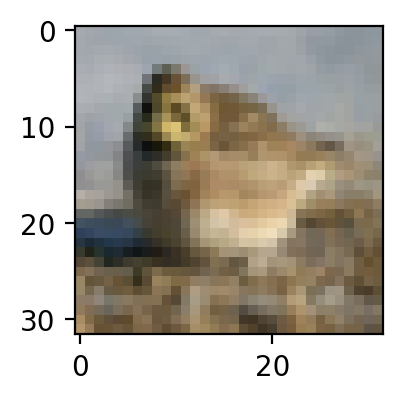


Stats of batch #2:
# of Samples: 10000

Label Counts of [0](AIRPLANE) : 984
Label Counts of [1](AUTOMOBILE) : 1007
Label Counts of [2](BIRD) : 1010
Label Counts of [3](CAT) : 995
Label Counts of [4](DEER) : 1010
Label Counts of [5](DOG) : 988
Label Counts of [6](FROG) : 1008
Label Counts of [7](HORSE) : 1026
Label Counts of [8](SHIP) : 987
Label Counts of [9](TRUCK) : 985

 Example of Image 349
Image - Min Value : 9 Max Value: 254
Image - Shape: (32, 32, 3)
Label - Lable Id: 6 Name: frog


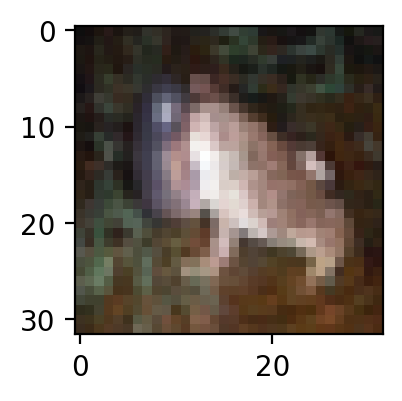


Stats of batch #2:
# of Samples: 10000

Label Counts of [0](AIRPLANE) : 984
Label Counts of [1](AUTOMOBILE) : 1007
Label Counts of [2](BIRD) : 1010
Label Counts of [3](CAT) : 995
Label Counts of [4](DEER) : 1010
Label Counts of [5](DOG) : 988
Label Counts of [6](FROG) : 1008
Label Counts of [7](HORSE) : 1026
Label Counts of [8](SHIP) : 987
Label Counts of [9](TRUCK) : 985

 Example of Image 8650
Image - Min Value : 18 Max Value: 229
Image - Shape: (32, 32, 3)
Label - Lable Id: 2 Name: bird


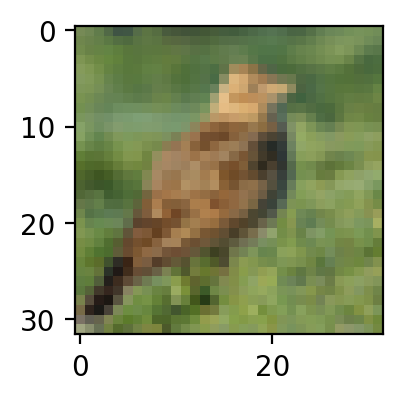

In [15]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
#explore the validation dataset
batch_id = 2
#sample_id = random.randint(0,10000) #some random image
sample_ids = random.sample(range(10001), 5)
for sid in sample_ids:
  display_stats(cifar10_data_folder_path, batch_id, sid)
  #plt.imshow(simg)

#1. Load Batch
This function loads the given batch files and returns X, Y, y according to the properties given below.

For classification tasks, especially in neural networks, it's common to represent the target classes in a one-hot encoded format. This format converts categorical class labels into a binary matrix representation.

* ```X``` contains the image pixel data, has size ```d×n```, is of type double or single and has entries between 0 and 1. n is the number of images (10000) and d the dimensionality of each image (3072=32×32×3).
* ```Y``` is ```K×n``` (```K```= # of labels = 10) and contains the one-hot representation of the label for each image.
* ```y``` is a vector of length n containing the label for each image.

In [16]:
def loadBatch(batchfile_name):
  """
    'with' keyword is used for context management, ensuring the file is properly closed after
    its suite finishes, even if exceptions are raised within

    'pickle' here is used to deserialize the data from the file, laoding it into a Python object.
    The line loads entire content of the file into a `batch` dictionary
  """
  with open(batchfile_name, mode='rb') as file:
    batch = pickle.load(file, encoding='bytes')

  print('Batch labels length: ', len(batch[b"labels"]))

  """
    ensures values are normalized: converts the pixel values from the range [0,255] to [0,1]
    .T: shorthand for transposing the matrix, results in it being transposed to shape `(d,n)`,
    where each column represents a data point
  """
  X = (batch[b"data"]/255).T
  print('Batch data shape: ', X.shape)

  """
    Retrieve the labels corresponding to each image in the batch;
    labels are integers from 0 to 9, each representing a class (e.g., airplane, automobile, bird etc)
  """
  y = batch[b"labels"]

  """
    Creates a one-hot encoding matrix 'Y' from the labels 'y'
    `np.eye(10)` creates a 10x10 identity matrix (only the elements in the main diagonal are 1, rest 0), and indexing this with `[y]` converts each label `y`
    into a one-hot encoded column (where the index corresponding to the label is 1, and all other entries are 0)

    Each value of y is essentially converted into a vector which is all 0 except for a 1
    at the index corresponding to the class label

  """
  Y = (np.eye(10)[y]).T
  print('Shape of Y: ', Y.shape)
  #print('Y : ', Y)

  return X, Y, y

##Task 1
Task 1 of the exercise asks us to read in and store the training, validation and test data.

In [17]:
#numpy Array, List
print("train data:")
batch_id = 1
train_X, train_Y, train_y = loadBatch(cifar10_data_folder_path + '/data_batch_' + str(batch_id))
print("====================")
batch_id = 2
print("validation data:")
val_X, val_Y, val_y = loadBatch(cifar10_data_folder_path + '/data_batch_' + str(batch_id))
print("====================")
print("test data:")
test_X, test_Y, test_y = loadBatch(cifar10_data_folder_path + '/test_batch')

#print('Shape of train_X: ', train_X.shape)
#print(type(train_X))
#print(train_X.dtype)


train data:
Batch labels length:  10000
Batch data shape:  (3072, 10000)
Shape of Y:  (10, 10000)
validation data:
Batch labels length:  10000
Batch data shape:  (3072, 10000)
Shape of Y:  (10, 10000)
test data:
Batch labels length:  10000
Batch data shape:  (3072, 10000)
Shape of Y:  (10, 10000)


#2. Pre-process the raw input data

Pre-processing the raw input data makes it more suitable for the training of a machine learning model.

Normalize the datasets:
The training, validation, and test data are all normalized using the mean and standard deviation values computed from the training data. This ensures consistency in pre-processing across different sets of data.

It consists of:
* Subtracting the mean from each column (image) and then
* dividing by the standard deviation of the corresponding feature.

In [18]:
#print(type(train_X))
#print(train_X.shape)

#Compute the mean of each channel

mean_X = np.mean(train_X, axis=1, keepdims=True)
train_X_zero_mean = train_X - mean_X

mean_channel_after = np.mean(train_X_zero_mean, axis=1, keepdims=True)

print("Mean of each channel before zero-mean operation:")
print("Red:   ", mean_X[0])
print("Green: ", mean_X[1])
print("Blue:  ", mean_X[2])
print("\nMean of each channel after zero-mean operation:")
print("(values are close to 0)")
print("Red:   ", mean_channel_after[0])
print("Green: ", mean_channel_after[1])
print("Blue:  ", mean_channel_after[2])

#Compute the standard deviation vector along the columns
std_X = np.std(train_X_zero_mean, axis=1, keepdims=True)

#Divide each pixel value by its corresponding standard deviation
train_X_norm = train_X_zero_mean / std_X


Mean of each channel before zero-mean operation:
Red:    [0.51767961]
Green:  [0.51502588]
Blue:   [0.51840471]

Mean of each channel after zero-mean operation:
(values are close to 0)
Red:    [3.27909921e-16]
Green:  [-1.91170413e-15]
Blue:   [-9.40053591e-16]


Now the **```train_X_norm```** contains pre-processed training data with zero mean and unit variance. We repeat the same pre-processing to the validation (**```val_X```**) and test data (**```test_X```**) as well to ensure consistency.


In [19]:
#Zero mean
val_X_zero_mean = val_X - mean_X
test_X_zero_mean = test_X - mean_X

#unit variance
val_X_norm = val_X_zero_mean / std_X
test_X_norm = test_X_zero_mean / std_X

Before we proceed, lets verify the pre-processing results

In [20]:
#Verify
#Train data
mean_X_train = np.mean(train_X_norm, axis=1)
std_X_train = np.std(train_X_norm, axis=1)

#Validation data
mean_X_val = np.mean(val_X_norm, axis=1)
std_X_val = np.std(val_X_norm, axis=1)

#Test data
mean_X_test = np.mean(test_X_norm, axis=1)
std_X_test = np.std(test_X_norm, axis=1)

# Print the mean and standard deviation for training data
print("Mean and Standard Deviation for Training Data:")
print("Mean: ", mean_X_train)
print("Standard Deviation: ", std_X_train)

# Print the mean and standard deviation for validation data
print("\nMean and Standard Deviation for Validation Data:")
print("Mean: ", mean_X_val)
print("Standard Deviation: ", std_X_val)

# Print the mean and standard deviation for test data
print("\nMean and Standard Deviation for Test Data:")
print("Mean: ", mean_X_test)
print("Standard Deviation: ", std_X_test)

Mean and Standard Deviation for Training Data:
Mean:  [ 1.14762644e-15 -6.72704115e-15 -3.30626637e-15 ...  1.98317307e-14
  1.67195313e-14  1.97693556e-14]
Standard Deviation:  [1. 1. 1. ... 1. 1. 1.]

Mean and Standard Deviation for Validation Data:
Mean:  [-0.02151247 -0.02224322 -0.02073346 ...  0.00306148  0.00081912
 -0.00583879]
Standard Deviation:  [0.9972366  0.99612618 0.99514764 ... 0.9918761  0.99197641 0.99003225]

Mean and Standard Deviation for Test Data:
Mean:  [-0.01997713 -0.01837621 -0.01445866 ...  0.01112209  0.00688517
  0.00331293]
Standard Deviation:  [0.99457784 0.99448534 0.99708297 ... 0.98394642 0.98458229 0.98249776]


Alright, so we indeed have 0 mean (or close to it, given the precision issues when performing floating-point arithmetic operations in computers). The standard deviation is also acceptably close to 1.

#3. Initialize the parameters of the model for learning phase


In [21]:
"""
K : number of classes, 10
d : number of features, 3072

W : (K, d)
b : (K, 1)
"""

K = 10
d = 3072

"""
loc : (mean) center of the distribution
scale = (standard deviation) width or spread of the distribution
"""

#Init the parameter W with Gaussian random values
W = np.random.normal(loc=0.0, scale=0.01, size=(K,d))

#Init the parameter b with Gaussian random value
b = np.random.normal(loc=0, scale=0.01, size=(K,1))

print('Shape of W (K,d): ', W.shape)
print('Shape of b (K,1): ', b.shape)

Shape of W (K,d):  (10, 3072)
Shape of b (K,1):  (10, 1)


#4. Evaluate the network function

s = Wx + b
p = softmax(s)

softmax(s) = exp(s) * (1^T exp(s))-1

### Softmax function:
The softmax function converts the raw output scores from the network (logits) into probabilities by taking the exponential of each output and then normalizing these values by dividing by the sum of all the exponentials. This ensures the output values are in the range (0, 1) and sum up to 1 - requirements for being considered a probability distribution.

### Matrix multiplication for ```s = Wx + b```.

Given a weight matrix W, an input matrix X, and a bias vector b, the linear step computes s for a batch of images. If X is of size ```d×n``` (with n images of dimension ```d```), ```W``` is of size ```K×d```, and ```b``` is of size ```K×1```, the result ```s``` will be of size ```K×n```, where each column of ```s``` corresponds to the logits for each image.

In [22]:
def softmax(x):
  """ Compute softmax values for each sets of scores in x."""
  #by subtracting the max value of x along the specified axis, we improve stability;
  #This prevents exponentiation of large numbers, which can lead to numerical overlflow!
  e_x = np.exp(x - np.max(x, axis=0))

  #e_x.sum along the specified axis is calculated; followed by nomalizing the values;
  return e_x/e_x.sum(axis=0)

def EvaluateClassifier(X, W, b):
  """
  Evaluate the classifier on multiple images.

  Parameters:
  - X: Input data of size dxn - each column is an image
  - W: Weight matrix of size Kxd
  - b: Bias vector of size Kx1

  Returns:
  - P: The matrix of probabilities for each class for each image, size Kxn
  """

  #Linear step
  s = np.dot(W,X) + b

  #Softmax step
  P = softmax(s)

  return P



We run on a subset of the training data given a random initialization of the network's parameters.

In [23]:
P = EvaluateClassifier(train_X_norm[:, :100], W, b)
print('Shape of P:', P.shape)
print(train_X_norm.shape)

Shape of P: (10, 100)
(3072, 10000)


#5. Compute the cost

Mathematically, the cost function is
$$
\mathcal{J}(\mathcal{D}, \lambda, W, b) =\frac{1}{\mathcal{D}}\sum _{(x,y)\in\mathcal{D}}l_{cross}(\mathbf{x}, y, W, \mathbf{b}) + \lambda\sum_{i,j}W^{2}_{ij}
$$

where
$$
l_{cross} (\mathbf{x}, y, W, \mathbf{b}) = -log(p_y)
$$

and $\lambda$ is the regularization term.

In [24]:
def ComputeCost(X, Y, W, b, lambd):

  """
    Compute the cost function J(D, lambd, W, b) for given parameters.

    Parameters:
    - D: Number of data points in the dataset.
    - lambd: Regularization parameter.
    - W: Weight matrix.
    - b: Bias vector.
    - X: Input data matrix.
    - Y: One-hot encoded labels.

    Returns:
    - J: Cost function value.
    """

  #Number of data points
  N = X.shape[1]

  #Evaluate classifier output
  P = EvaluateClassifier(X, W, b)

  """
    Calculate the cross entropy loss for all samples
    Y: (K,N) have the true labels of the data (one-hot encoded form)
    P: (K,N) is the predicted probabilities of the model for each class for each sample
    np.log(P) heavily penalizes the model when it assigns low probabilities to the correct classes
    (log(x) approaches infinity as x approaches 0)

    Y * np.log(P) performs an element-wise multiplication, Y being hot-encoded (all elements except true prob. are 0),
    it filters out the false classes. Only log of the predicted probability of the true class remains.

    negative sign is introduced, because log of a quantity between 0 and 1 is negative and since typically
    loss is a positive, -1 is multiplied

    Finally, the lower the probability the model assigns to the correct classes across all samples,
    the higher the total loss.

    A perfect model would assign a probability of 1 to the correct class for every sample, leading to a cross-entropy of 0.
    (since -np.sum(np.log(1)) = 0)
  """
  l_cross = -np.sum(Y * np.log(P))

  #Average the cross-entropy loss over the dataset
  J = (l_cross)/N

  #Add regularization term
  reg_term = lambd * np.sum(np.square(W))
  J += reg_term

  return J


#6. Compute the accuracy of the network's predictions

In [25]:
def ComputeAccuracy(X, y, W, b):
  """
  evaluates the classifier's accuracy on a given dataset by comparing the
  predicted class labels with the true class labels and calculating the
  ratio of correctly classified samples to the total number of samples.
  """

  #calculate the index of the maximum probability predicted by the classifier
  #for each sample in the dataset X
  argMaxP = np.argmax(EvaluateClassifier(X, W, b), axis=0)

  #compare the predicted class labels argMaxP with the true class labels y
  #select the elements where they match. Transpose the resulting boolean array to match the dims of argMaxP
  #count = argMaxP.T[argMaxP == np.asarray(y)].shape[0]
  correct_predictions = np.sum(argMaxP == y)

  #calculate the number of correctly classified samples by counting the number of 'True' values in the boolean array
  #acc = count / X.shape[1]
  acc = correct_predictions / len(y)
  return acc


# 7. Evaluate, for a mini-batch, the gradients of the cost function w.r.t. W and b

In [26]:
def ComputeGradients(X, Y, P, W, lamda):

  N = X.shape[1]
  P = EvaluateClassifier(X, W, b)

  G = -(Y-P)

  #grad_w calculation:
  """
    @: performs Matrix multiplication in python
    results in a matrix of shape (d, n), where d is the number of features, and n the number of samples
  """
  grad_W = (1/N) * (G @ X.T) + (2 * lamda * W)

  #grad_b calculation:
  """
    G@np.ones(N) results in a vector of shape (K,)
    reshape operation is done to bring the vector to a column vector of shape (K, 1) where K is the number of the output units
  """
  grad_b = np.reshape((1/N) * (G @ np.ones(N)), (Y.shape[0], 1))

  return grad_W, grad_b


##Ensuring our Gradient descent computation is correct

Next, we need to check if our analytical gradient computation is correct. For this we have a numerical gradient computational function available to compare our results with.

In [27]:
def ComputeGradsNum(X, Y, P, W, b, lamda, h):
	""" Converted from matlab code """
	no 	= 	W.shape[0]
	d 	= 	X.shape[0]

	grad_W = np.zeros(W.shape);
	grad_b = np.zeros((no, 1));

	c = ComputeCost(X, Y, W, b, lamda);

	for i in range(len(b)):
		b_try = np.array(b)
		b_try[i] += h
		c2 = ComputeCost(X, Y, W, b_try, lamda)
		grad_b[i] = (c2-c) / h

	for i in range(W.shape[0]):
		for j in range(W.shape[1]):
			W_try = np.array(W)
			W_try[i,j] += h
			c2 = ComputeCost(X, Y, W_try, b, lamda)
			grad_W[i,j] = (c2-c) / h

	return [grad_W, grad_b]



```assert_array_almost_equal``` is a function provided by the NumPy testing module (numpy.testing) that is used to compare whether two arrays are almost equal within a specified tolerance.

If the following provides no error or output, then it means that indeed both the arguments are quite close to being equal.

In [28]:
#print(type(train_X_norm))
#print(train_X_norm.shape)
#print(train_X_norm.dtype)
#print((train_Y.shape))

grad_W_test_ana, grad_b_test_ana = ComputeGradients(train_X_norm[:, :2], train_Y[:,:2], P, W, lamda=0)
grad_W_test_num, grad_b_test_num = ComputeGradsNum(train_X_norm[:, :2], train_Y[:,:2], P, W, b, lamda=0, h=1e-6)

npt.assert_array_almost_equal(grad_W_test_ana, grad_W_test_num)
npt.assert_array_almost_equal(grad_b_test_ana, grad_b_test_num)

#8. Perform the mini-batch gradient descent

In [29]:
import re
import os

def plot_learned_images(W, b, num=0, save=False):
  labels = load_label_names()
  for ix, arr in enumerate(W):
    arr = (arr - np.min(arr)) / (np.max(arr) - np.min(arr))

    img = np.dstack((
        arr[0:1024].reshape(32, 32),
        arr[1024:2048].reshape(32, 32),
        arr[2048:].reshape(32, 32)
    ))

    title = re.sub('b\'', '', str(labels[ix]))
    title = re.sub('\'', '', title)
    fig = plt.figure(figsize=(3, 3))
    ax = fig.add_subplot(111)
    ax.imshow(img, interpolation='bicubic')
    ax.set_title('Category = ' + title, fontsize=15)

    if not os.path.exists("plots"):
      os.makedirs("plots")
    if save:
      plt.savefig("plots/" + str(num) + "_" + title + ".png", bbox_inches="tight")
    plt.show()


In [30]:
import os
def plot_perf_loss(n_epochs, costs_train, costs_validation, title):
  """
    Plot performance curves

  """
  epochs = np.arange(n_epochs)
  figure, axis = plt.subplots(figsize=(10, 8))
  axis.plot(epochs, costs_train, label = "Training loss")
  axis.plot(epochs, costs_validation, label = "Validation loss")
  axis.legend()
  axis.set(xlabel="epoch", ylabel="loss")
  axis.grid()
  if not os.path.exists("plots"):
    os.makedirs("plots")
  plt.savefig("plots/"+title+".png", bbox_inches="tight")


def MiniBatchGD(X, Y, W, b, lamda=0, n_batch=100, n_epochs=40, verbose=True, eta=0.001, plot_perf=False, title=None):
  """
    X: The input data matrix.
    Y: The one-hot-encoding labels matrix.
    labda: The regularization term.
    n_batch : the number of images in a mini-batch
    eta: the learning rate
    n_epochs: the number of runs through the whole training set

  """

  if plot_perf:
    #cross entropy loss for the training and validation phases
    costs_training = np.zeros(n_epochs)
    costs_validation = np.zeros(n_epochs)

  for n in range(n_epochs):
    for j in range(n_batch):
      """
        for each mini-batch, calc the grad_W and grad_b
        followed by updating the model params W and b using the gradient descent update rule
      """
      N = int(X.shape[1]/n_batch)
      j_start = (j)*N
      j_end = (j+1) * N

      X_batch = X[:, j_start:j_end]
      Y_batch = Y[:, j_start:j_end]

      grad_W, grad_b = ComputeGradients(X_batch, Y_batch, P, W, lamda)

      #update
      W = W - (eta * grad_W)
      b = b - (eta * grad_b)

    if plot_perf:
      costs_training[n]   = ComputeCost(train_X_norm, train_Y, W, b, lamda)
      costs_validation[n] = ComputeCost(val_X_norm, val_Y, W, b, lamda)

  if plot_perf:
    plot_perf_loss(n_epochs, costs_training, costs_validation, title)

  """Compute accuracies"""
  acc_train = ComputeAccuracy(train_X_norm, train_y, W, b)
  acc_val = ComputeAccuracy(val_X_norm, val_y, W, b)
  acc_test = ComputeAccuracy(test_X_norm, test_y, W, b)

  if verbose:
    print("Training accuracy: ", acc_train)
    print("Validation accuracy: ", acc_val)
    print("Test accuracy: ", acc_test)

  return acc_train, acc_val, acc_test, W, b

We will now proceed with training and testing our model.
We'll use the following parameter settings:

* ```n_batch = 100```
* ```eta = 0.001```
* ```n_epochs = 40```
* ```lambda = 0```

Training accuracy:  0.456
Validation accuracy:  0.3821
Test accuracy:  0.387


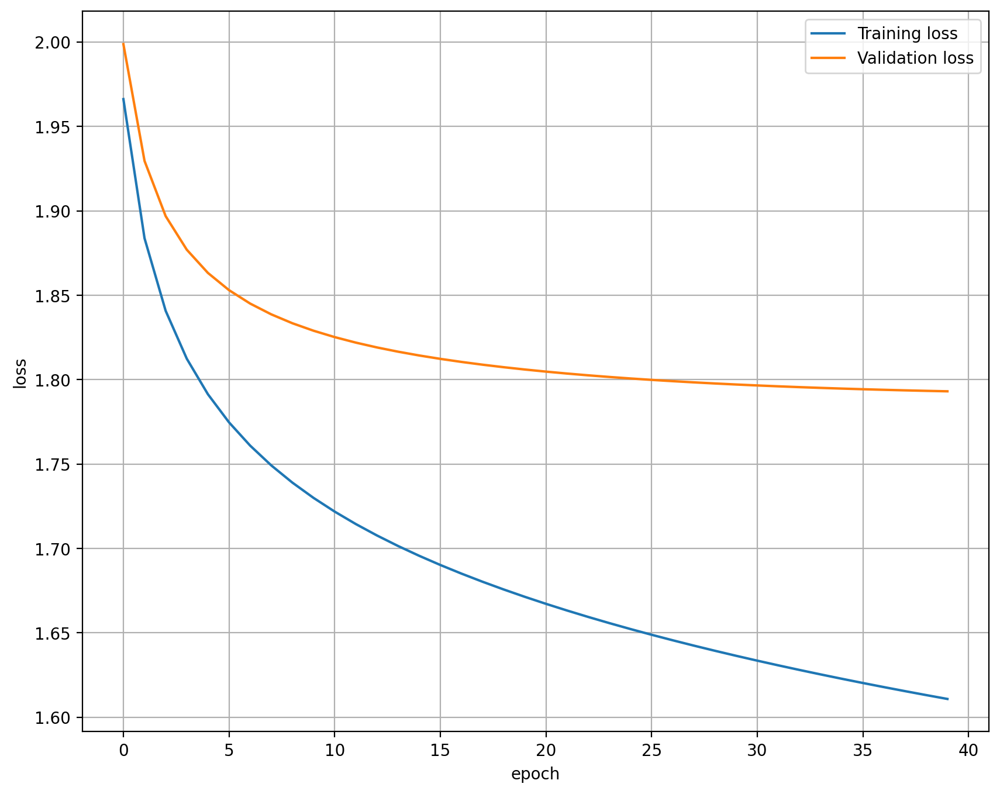

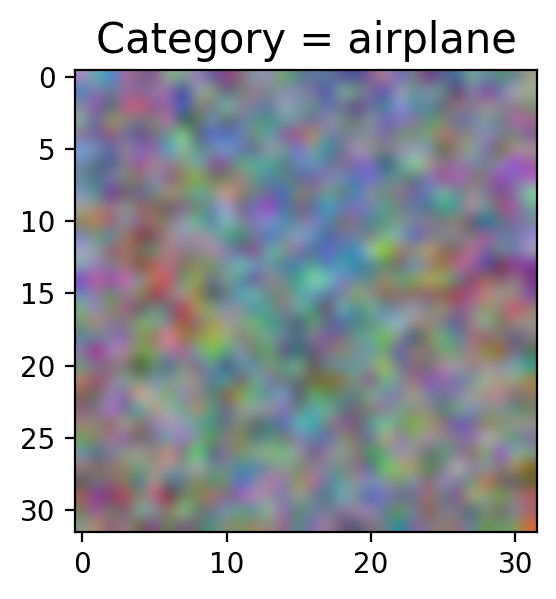

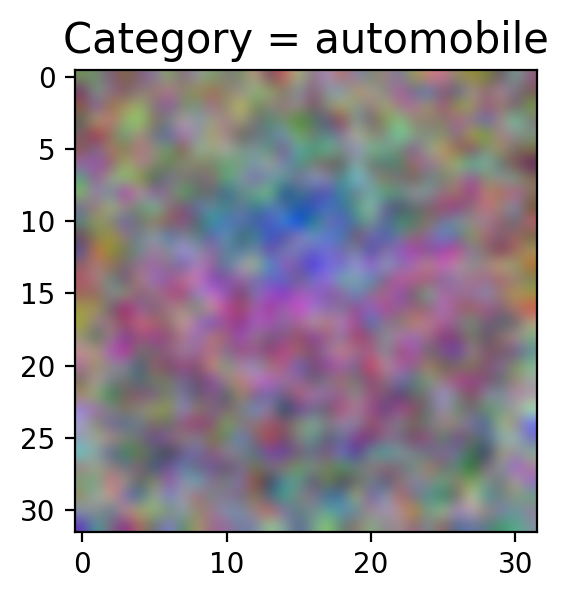

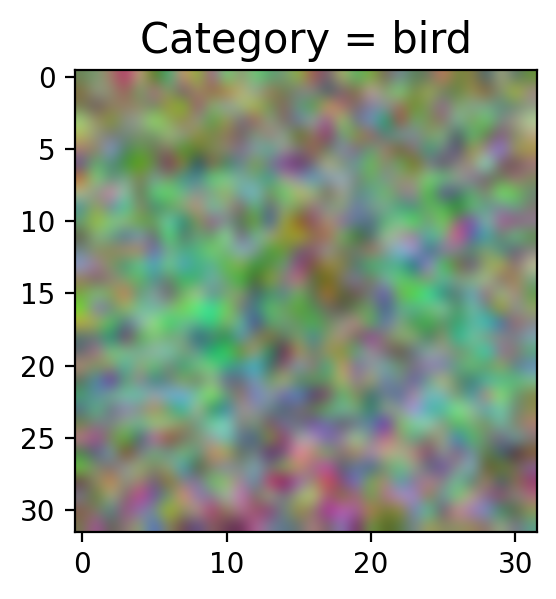

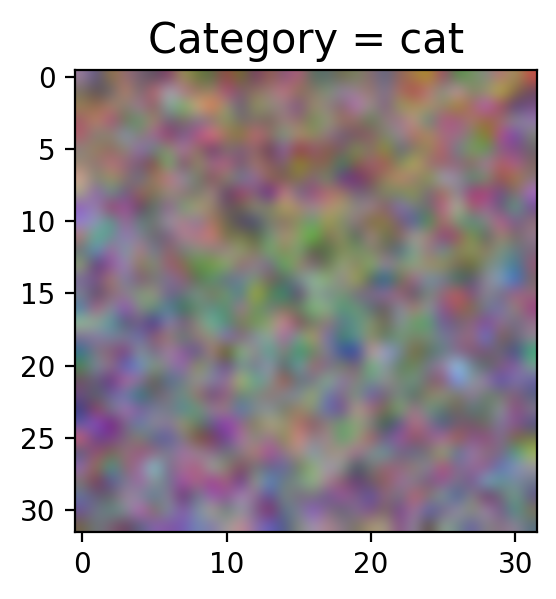

...

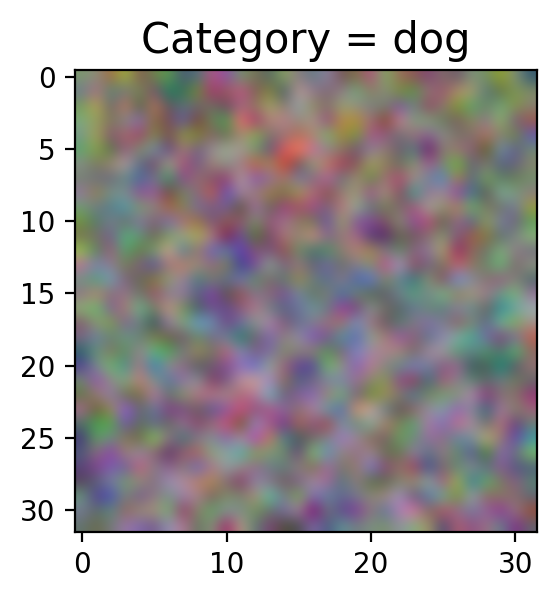

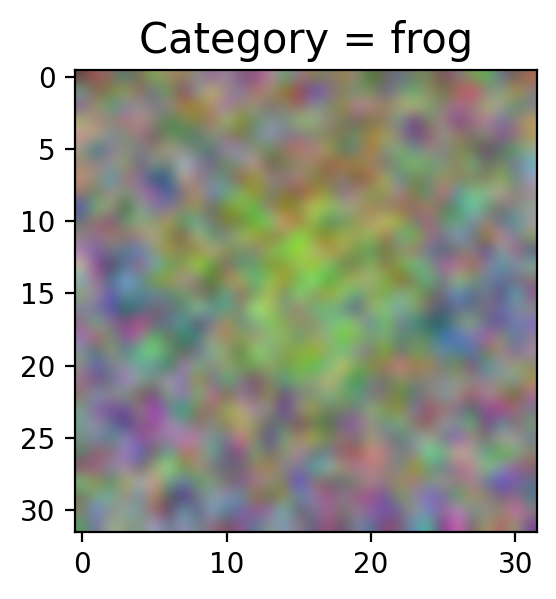

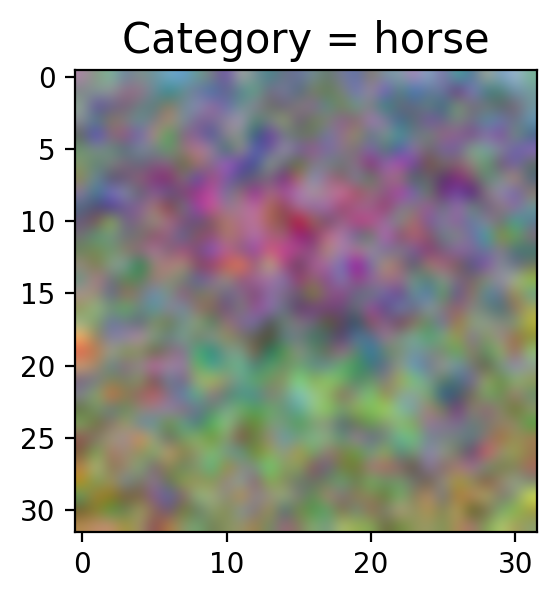

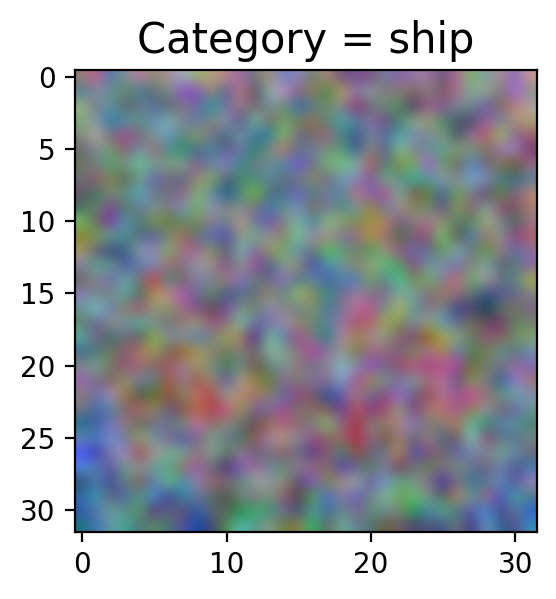

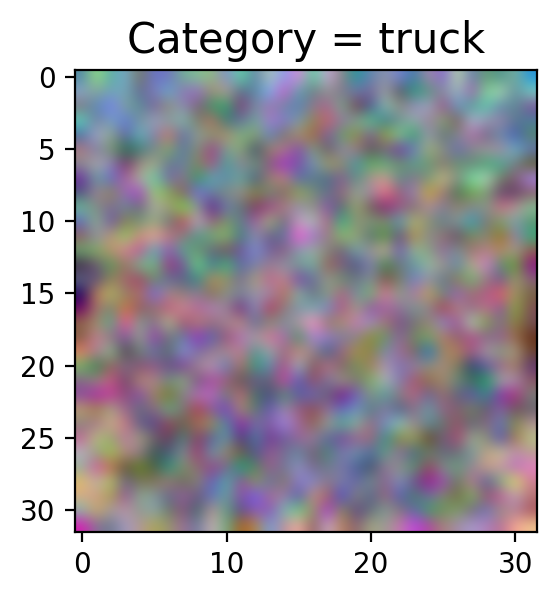

In [31]:
acc_train_set = []
acc_val_set = []
acc_test_set = []

acc_train, acc_val, acc_test, W, b = MiniBatchGD(
    train_X_norm, train_Y, W, b, lamda = 0, n_batch = 100,
    n_epochs = 40, eta = 0.001, plot_perf = True, title="Cost_plot_test")
plot_learned_images(W, b, save=False)

###Plot learned images


## Class templates visualized

Above plots demonsrate the Matrix W visualized as class templates.

The network was trained using the following parameters:
* ```n_batch = 100```
* ```eta = 0.001```
* ```n_epochs = 40```
* ```lambda = 0```


#Plots for the report
Next, we'll train the network on the following parameters:

* lambda=0, n epochs=40, n batch=100, eta=.1
* lambda=0, n epochs=40, n batch=100, eta=.001
* lambda=.1, n epochs=40, n batch=100, eta=.001  
* lambda=1, n epochs=40, n batch=100, eta=.001

Network parameters settings round: 0
Mean Train accuracy:  0.3584
Mean Validation accuracy:  0.23559999999999998
Mean Test accuracy:  0.23789999999999994
Std-dev Train accuracy:  0.0
Std-dev Validation accuracy:  2.7755575615628914e-17
Std-dev Test accuracy:  5.551115123125783e-17



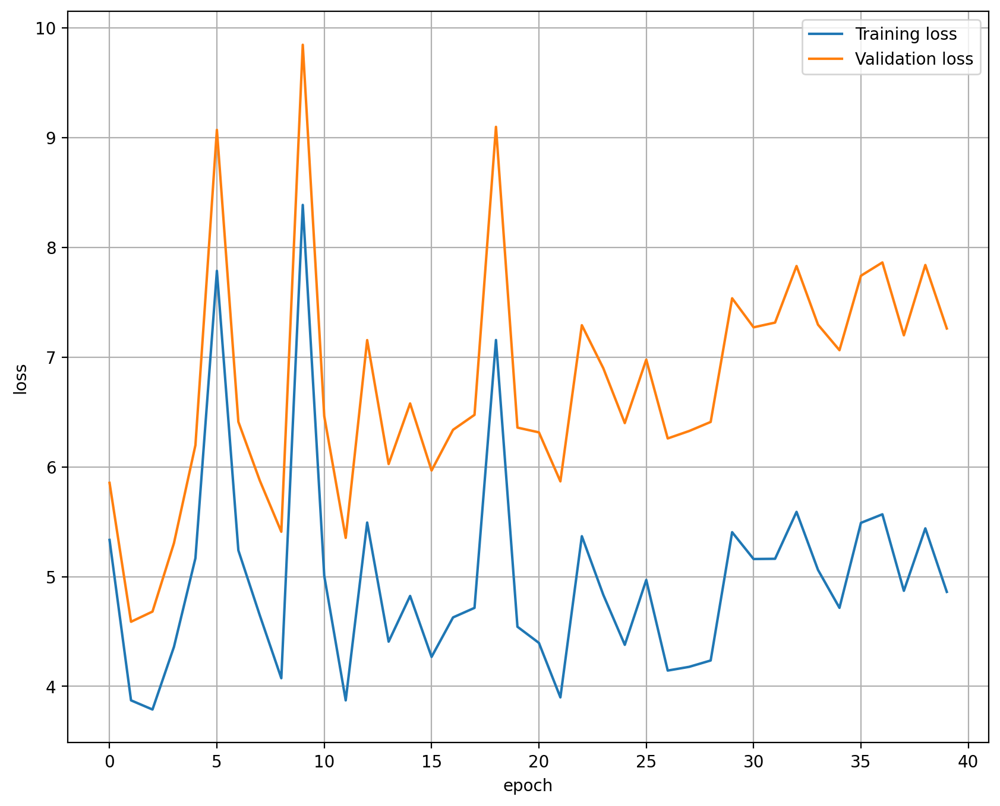

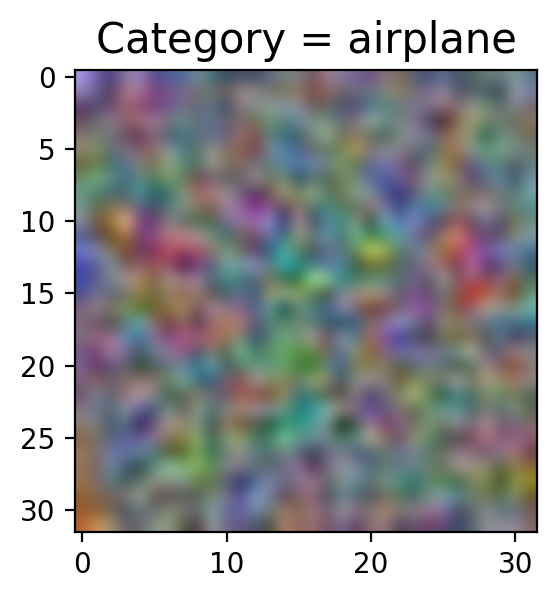

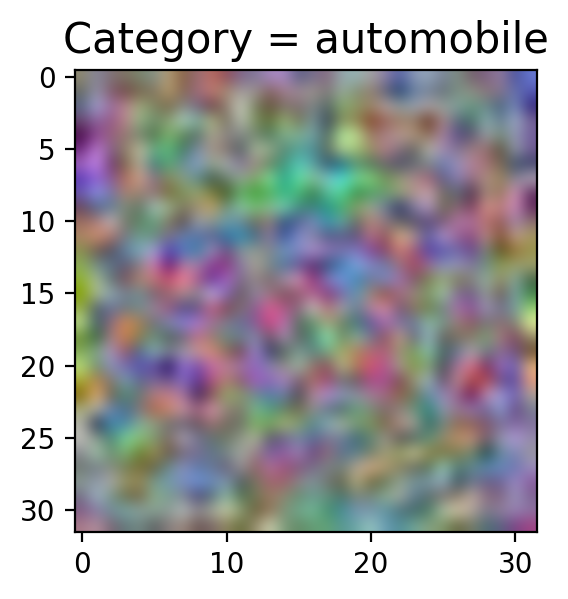

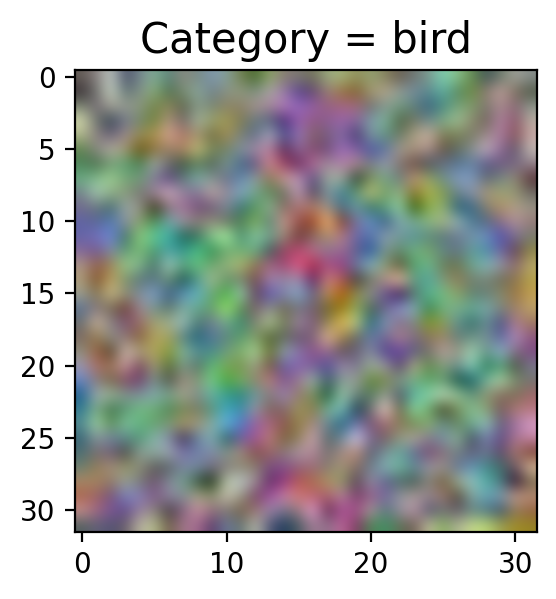

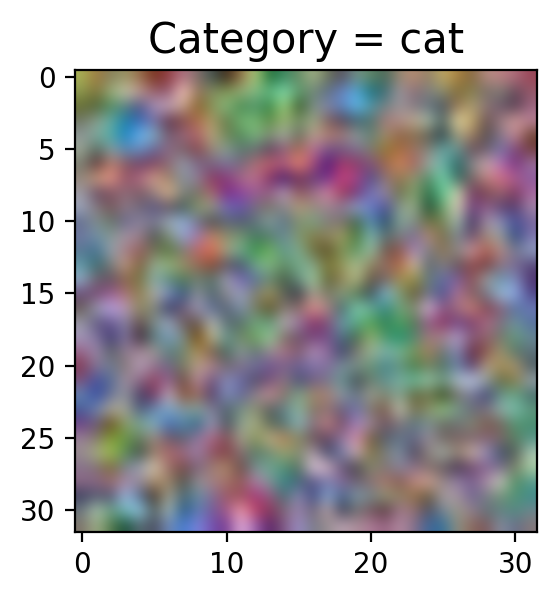

...

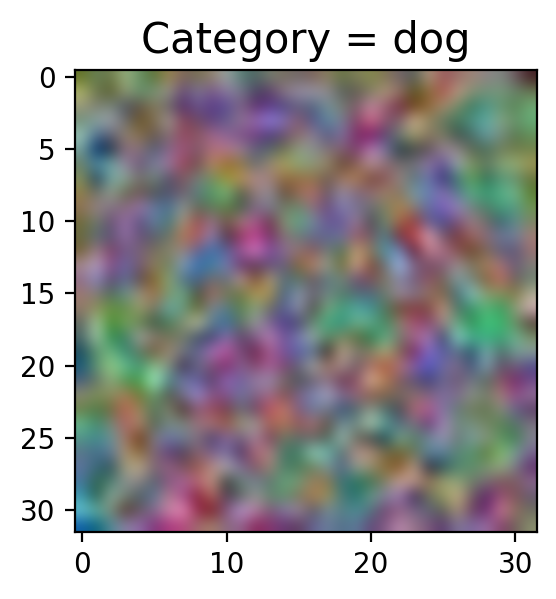

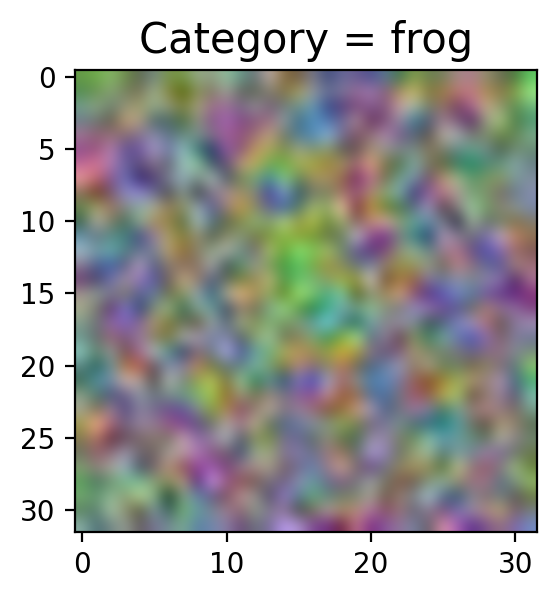

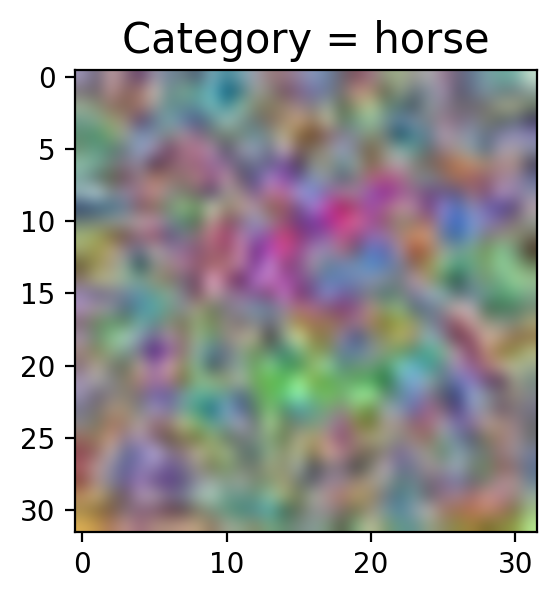

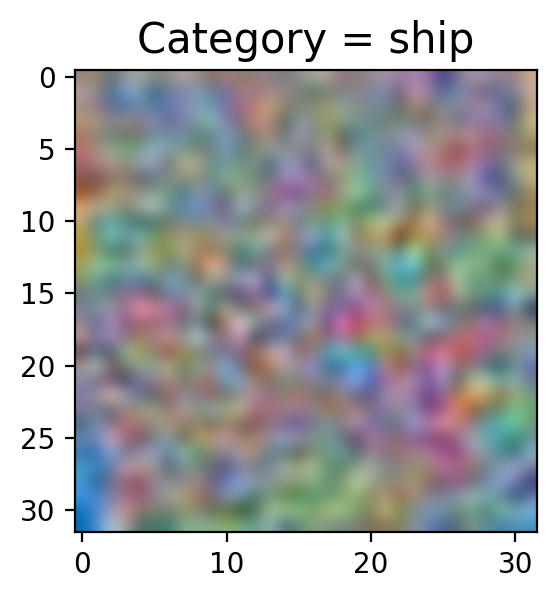

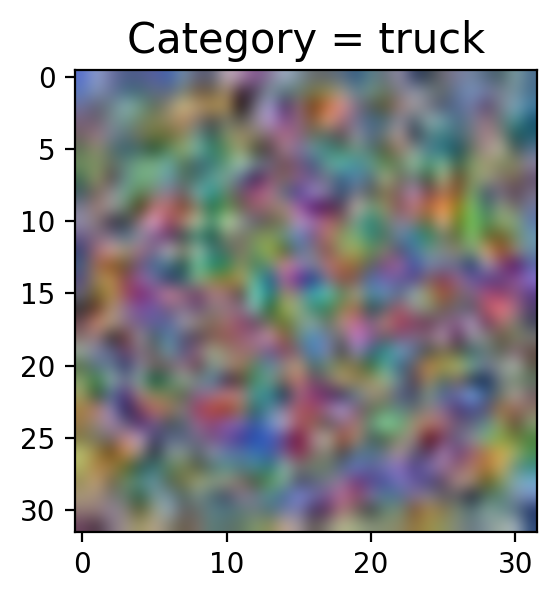

Network parameters settings round: 1
Mean Train accuracy:  0.4566
Mean Validation accuracy:  0.38710000000000006
Mean Test accuracy:  0.3921
Std-dev Train accuracy:  0.0
Std-dev Validation accuracy:  5.551115123125783e-17
Std-dev Test accuracy:  0.0



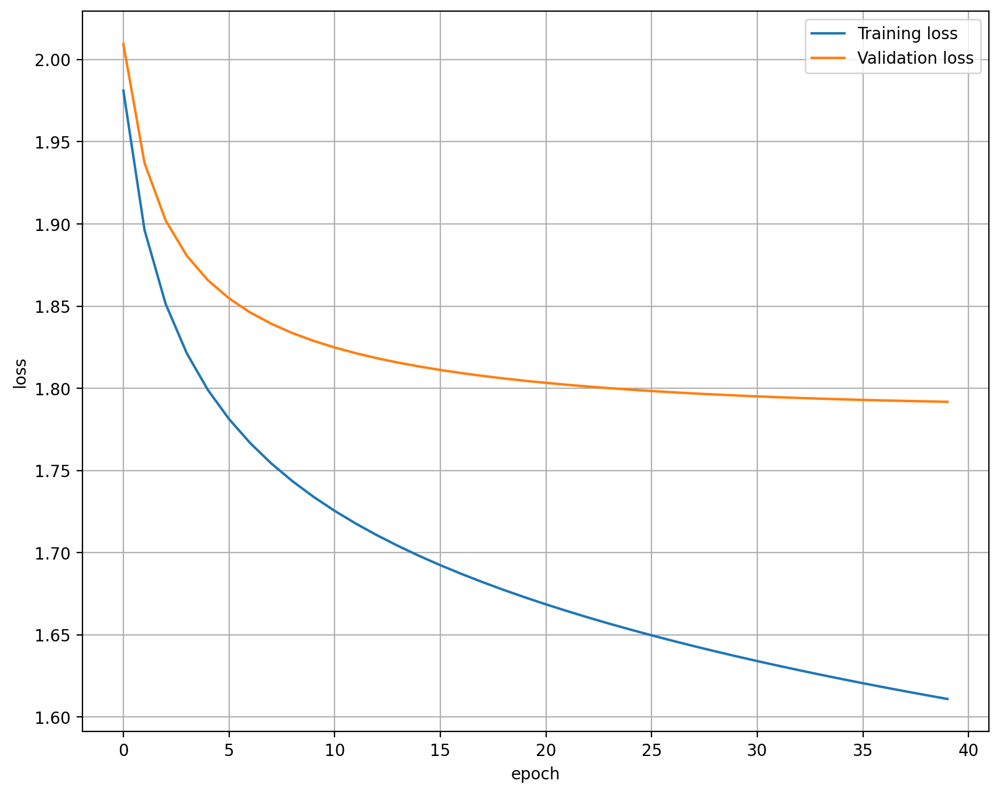

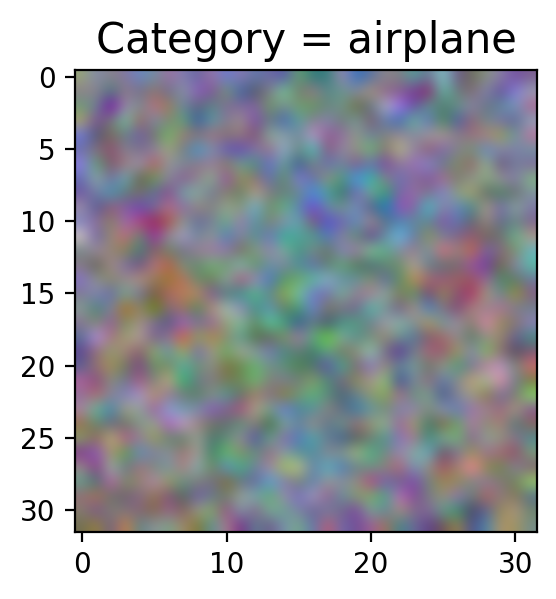

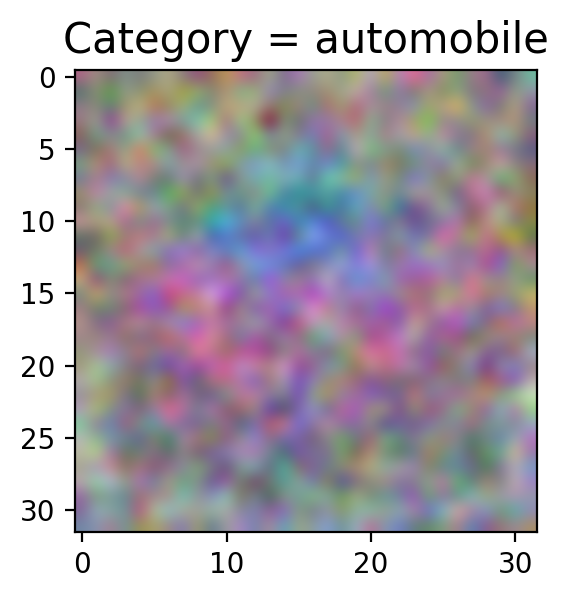

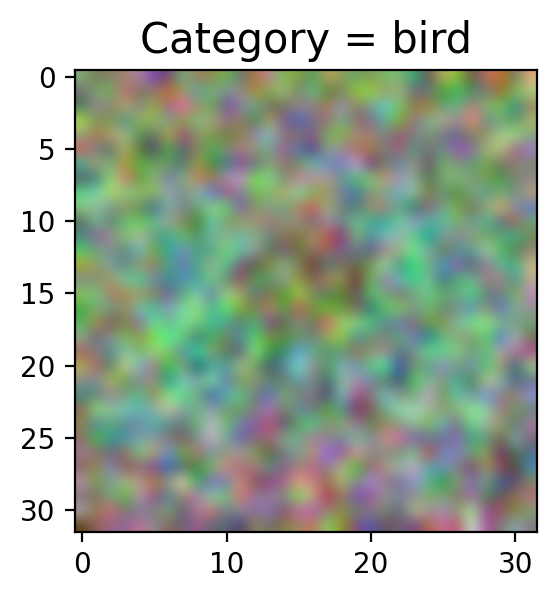

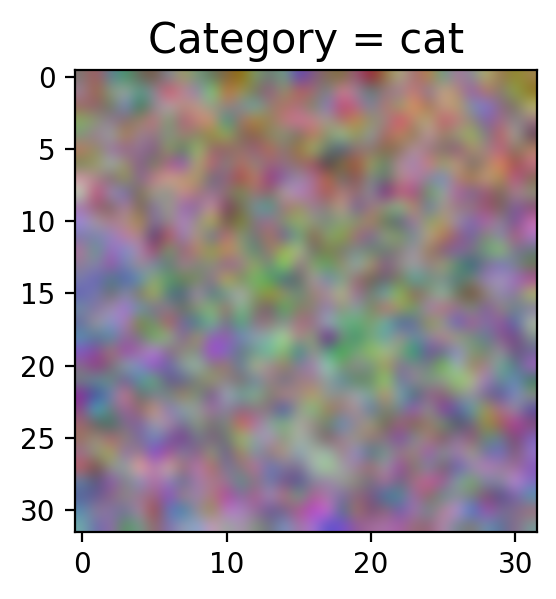

...

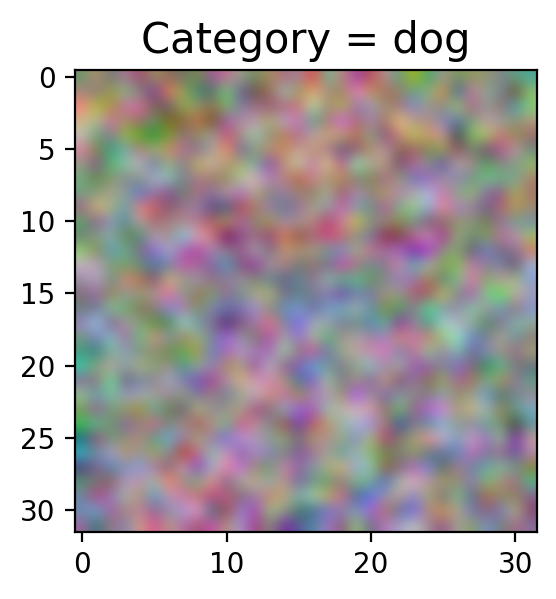

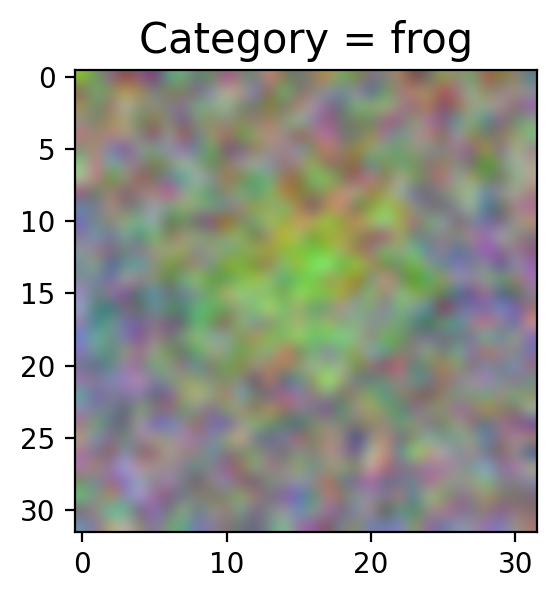

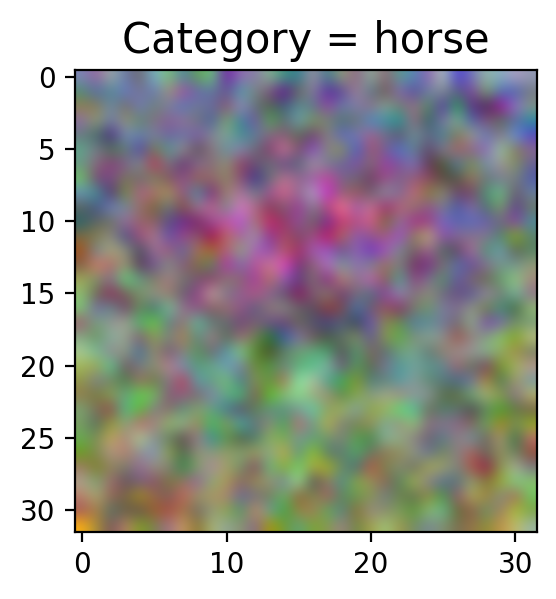

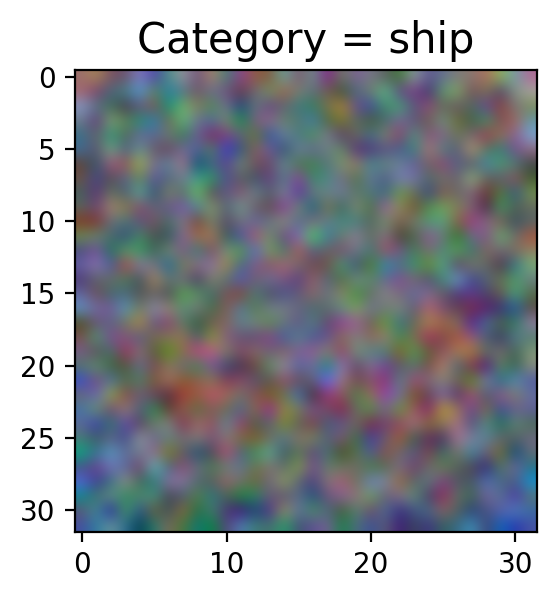

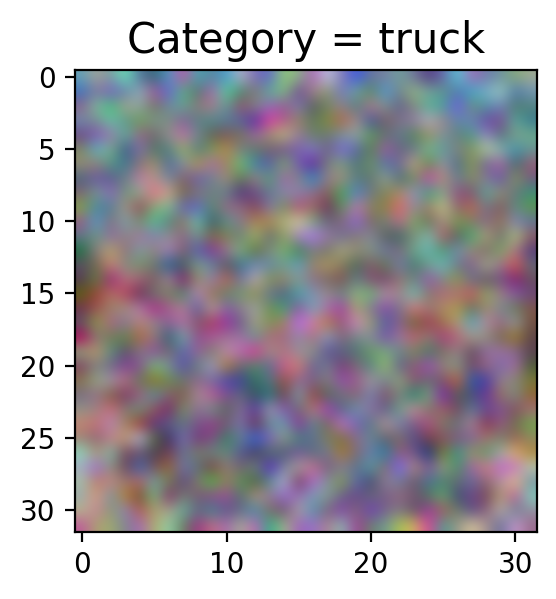

Network parameters settings round: 2
Mean Train accuracy:  0.4492
Mean Validation accuracy:  0.38520000000000004
Mean Test accuracy:  0.392
Std-dev Train accuracy:  0.0
Std-dev Validation accuracy:  5.551115123125783e-17
Std-dev Test accuracy:  0.0



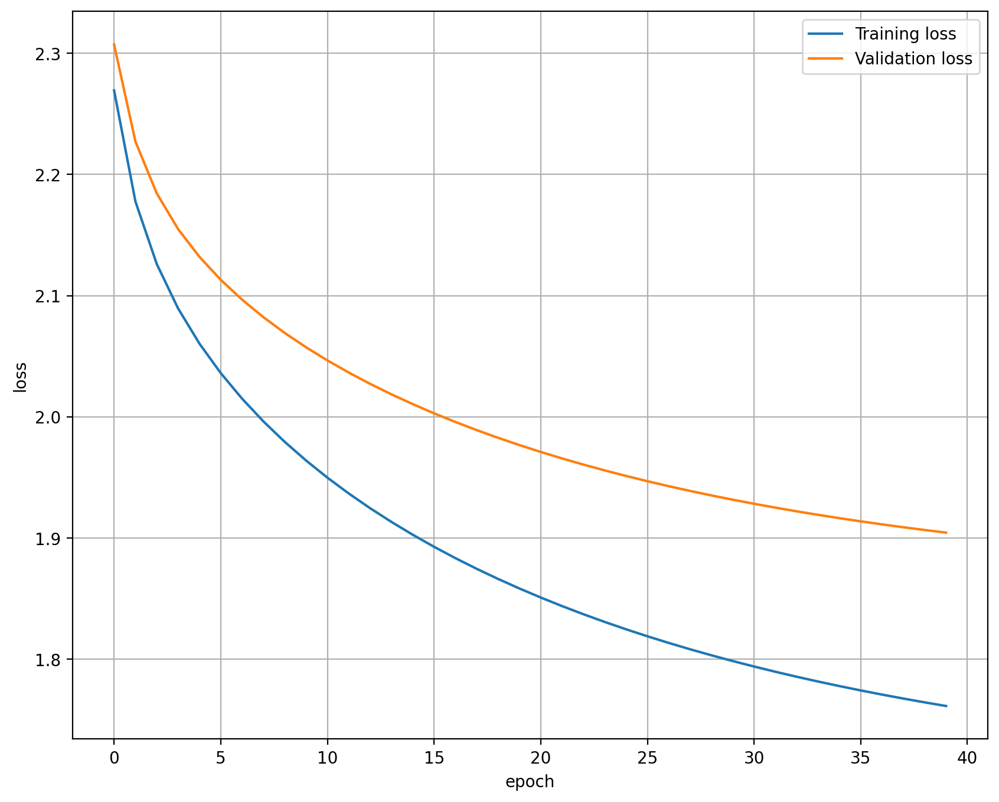

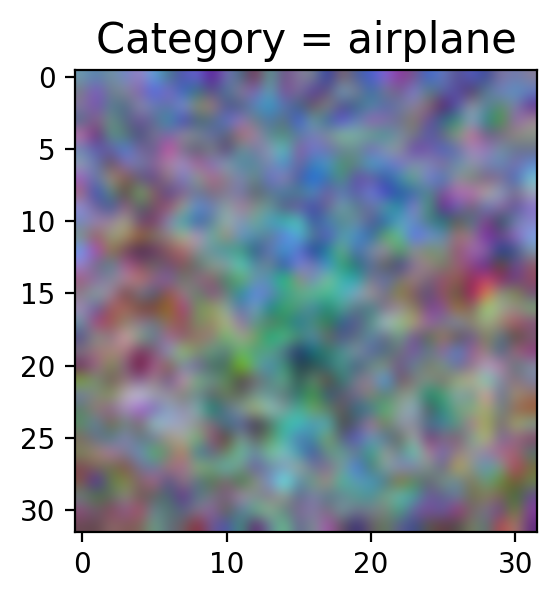

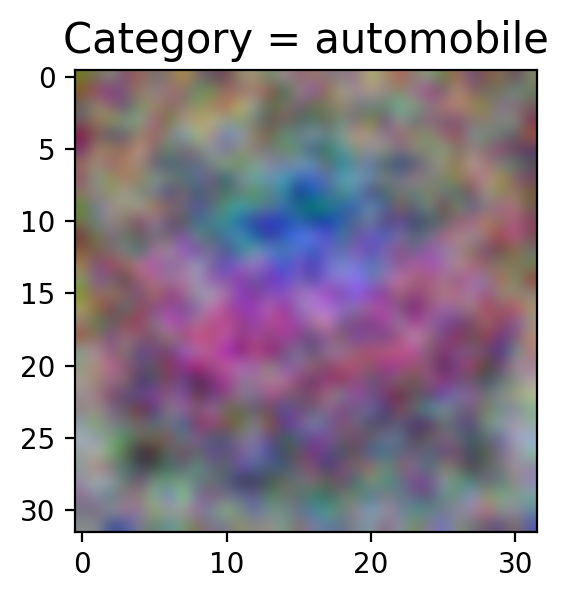

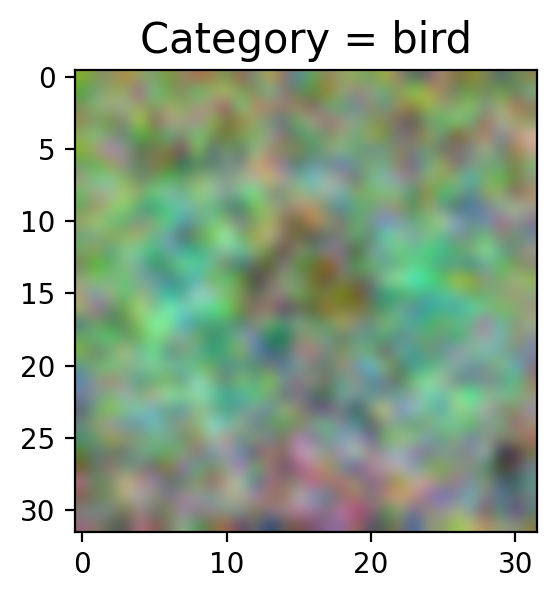

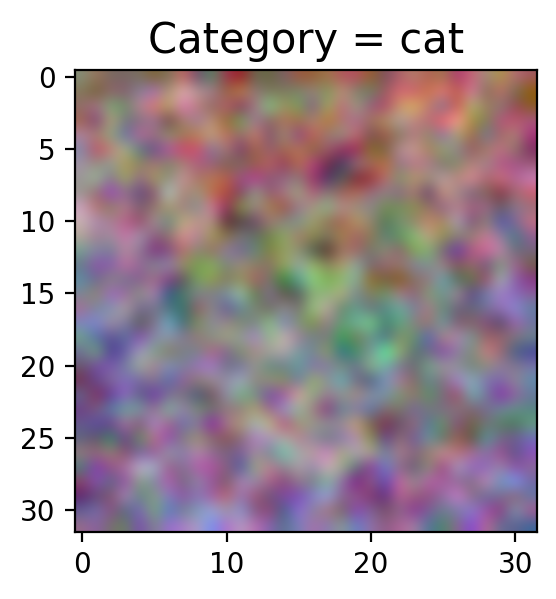

...

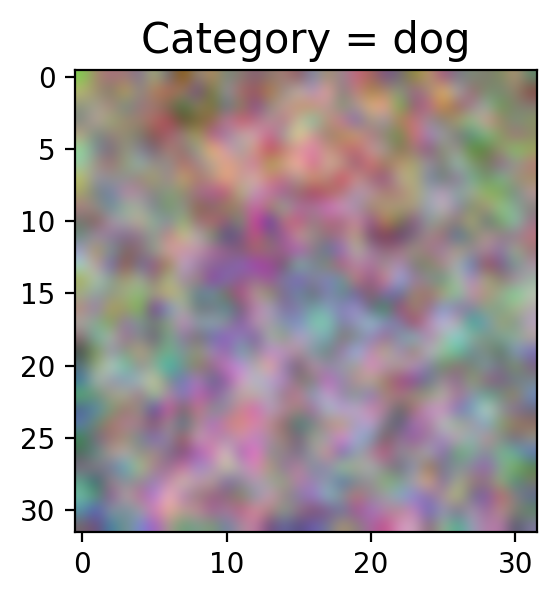

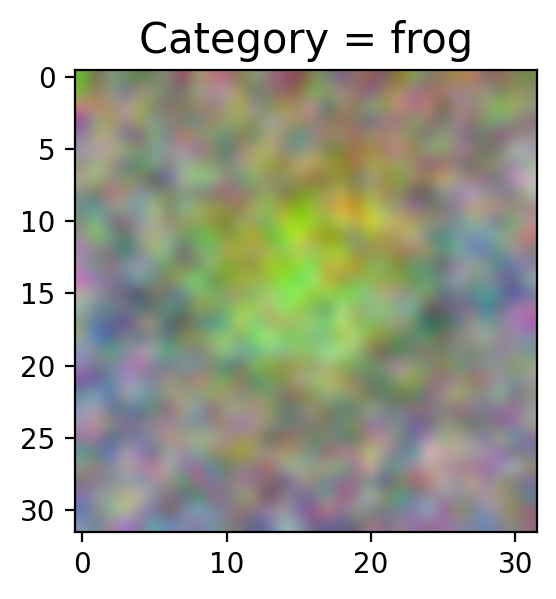

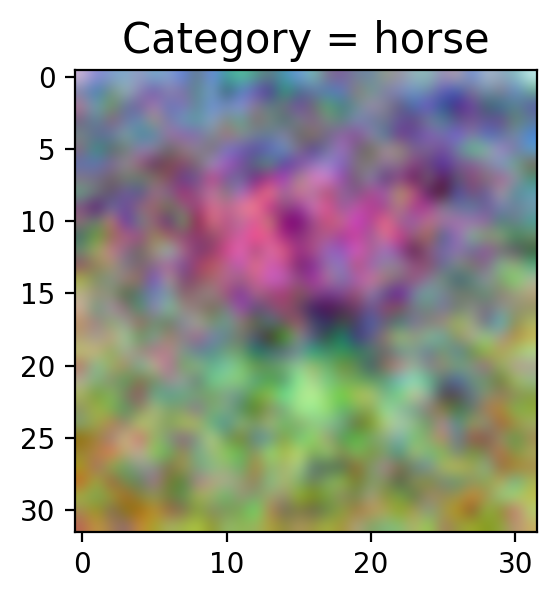

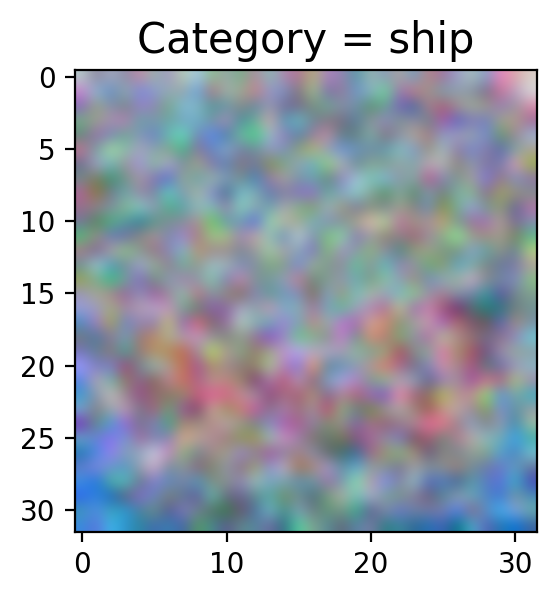

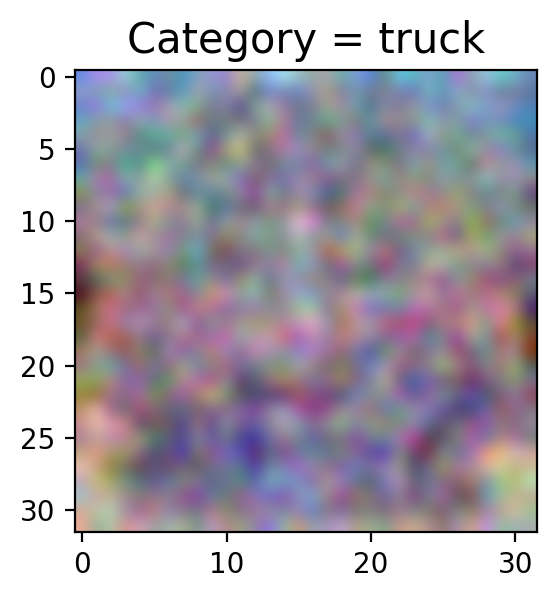

Network parameters settings round: 3
Mean Train accuracy:  0.4483
Mean Validation accuracy:  0.3872999999999999
Mean Test accuracy:  0.39109999999999995
Std-dev Train accuracy:  0.0
Std-dev Validation accuracy:  5.551115123125783e-17
Std-dev Test accuracy:  5.551115123125783e-17



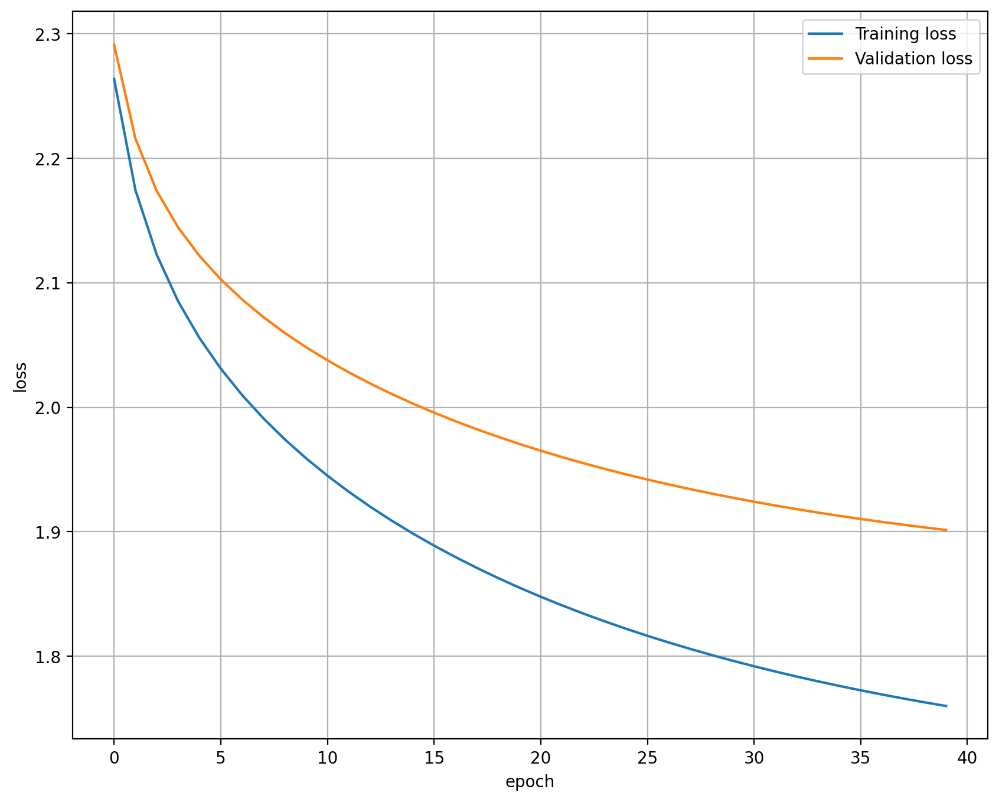

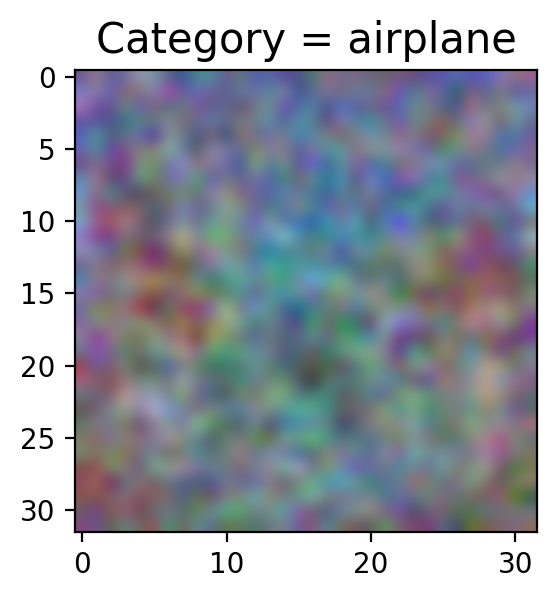

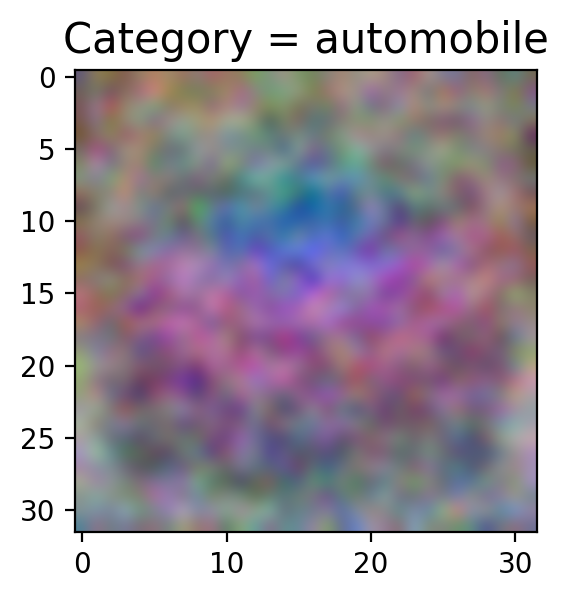

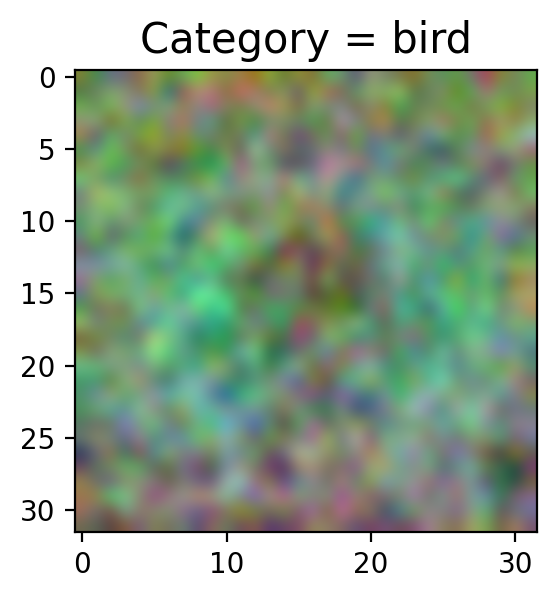

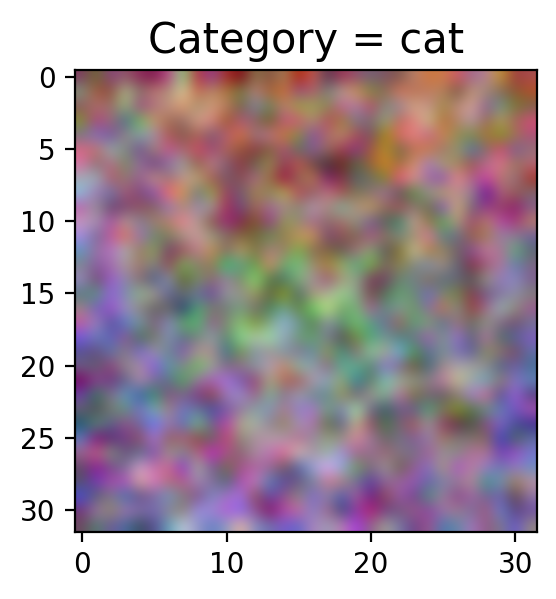

...

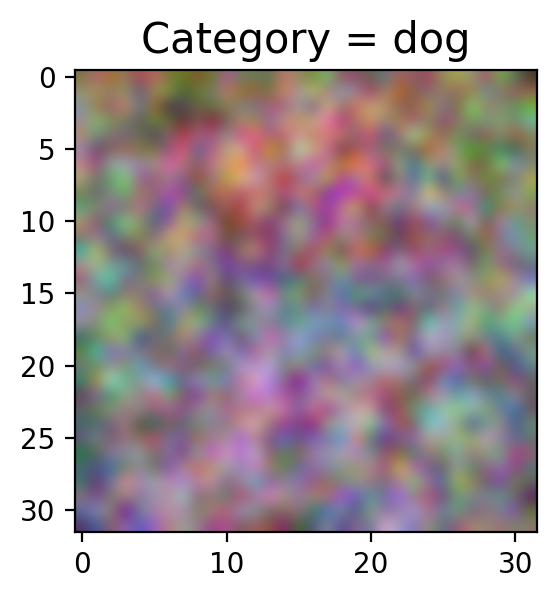

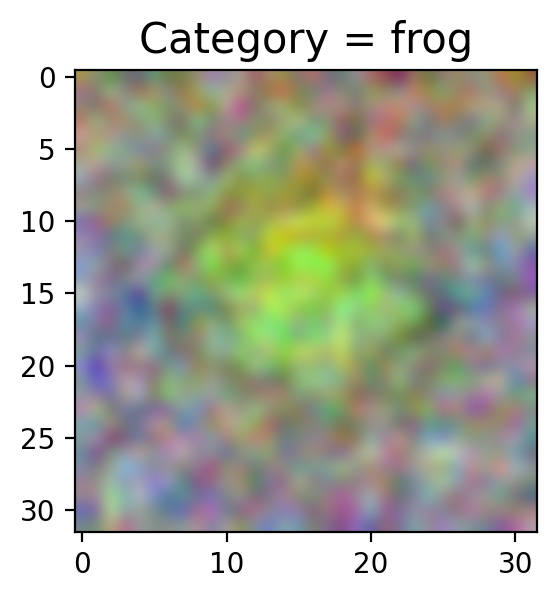

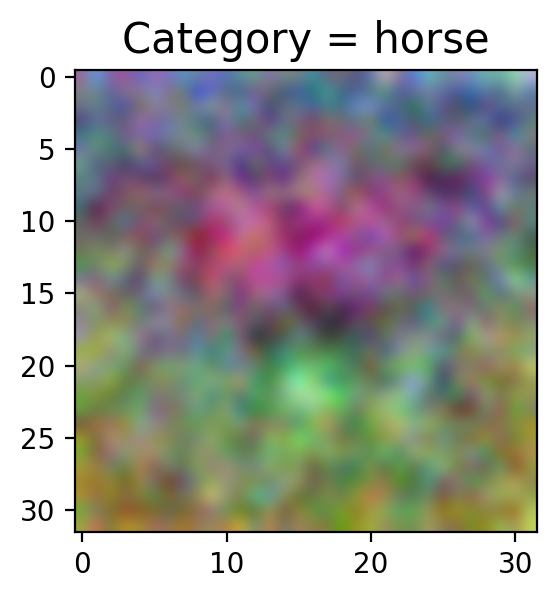

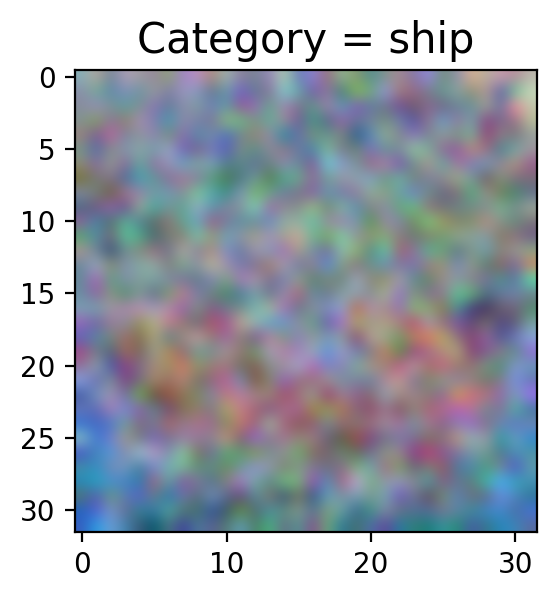

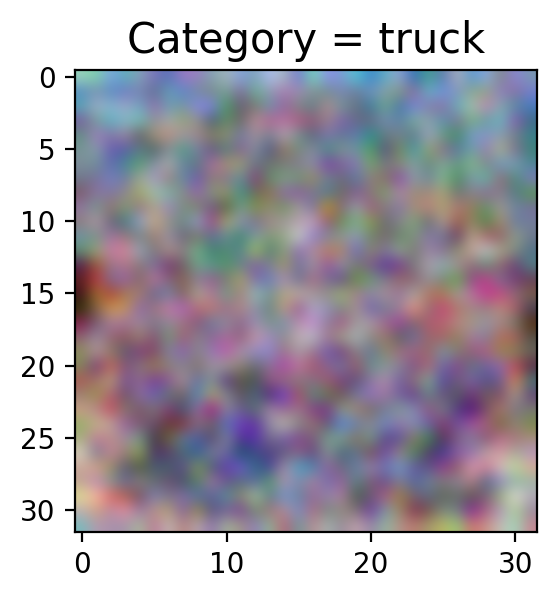

In [32]:
"""Training """
K = 10
d = 3072
lambdas = [0, 0, 0.1, 0.1]
etas = [0.1, 0.001, 0.001, 0.001]

for i in range(4):
  acc_trainings = []
  acc_validations = []
  acc_testings = []

  #Init the parameter W with Gaussian random values
  W = np.random.normal(loc=0.0, scale=0.01, size=(K,d))
  #Init the parameter b with Gaussian random value
  b = np.random.normal(loc=0, scale=0.01, size=(K,1))

  for j in range(10):
    acc_train, acc_val, acc_test, _, _ = MiniBatchGD(
        train_X_norm, train_Y, W, b, lamda=lambdas[i], eta=etas[i], verbose=False
    )
    acc_trainings.append(acc_train)
    acc_validations.append(acc_val)
    acc_testings.append(acc_test)

  print("Network parameters settings round: " + str(i))
  print("Mean Train accuracy: ", np.mean(acc_trainings))
  print("Mean Validation accuracy: ", np.mean(acc_validations))
  print("Mean Test accuracy: ", np.mean(acc_testings))

  print("Std-dev Train accuracy: ", np.std(acc_trainings))
  print("Std-dev Validation accuracy: ", np.std(acc_validations))
  print("Std-dev Test accuracy: ", np.std(acc_testings))
  print("=======================\n")

  _, _, _, W, b = MiniBatchGD(train_X_norm, train_Y, W, b, lamda=lambdas[i], eta=etas[i], verbose=False, plot_perf=True, title=str(i) + "_cost_plot_test")
  plot_learned_images(W, b, num=i, save=True)